In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import graphviz
import seaborn as sns; sns.set()
from sklearn.linear_model import SGDClassifier 
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.naive_bayes import GaussianNB, MultinomialNB, BernoulliNB
from sklearn.neighbors.nearest_centroid import NearestCentroid
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.metrics import *
import time


%matplotlib inline

In [2]:
cd code

/Users/tianchushu/Desktop/syntaxerror-mlpp2018/code


In [3]:
import final_connection
import final_default_grids
import final_explore_and_viz
import final_load_dfs
import final_plot
import final_preprocessing
import final_temporal
import indpv_lists as final_options
import jocojims
import final_classifier_final

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/psycopg2/__init__.py:144: UserWarning: The psycopg2 wheel package will be renamed from release 2.8; in order to keep installing from binary please use "pip install psycopg2-binary" instead. For details see: <http://initd.org/psycopg/docs/install.html#binary-install-from-pypi>.
  """)


In [4]:
# LOADS CSV WITH MERGED DATA WITH ACS
df = final_load_dfs.load_from_file('FINAL.csv')

#Save a clean copy for later viz purpose
viz_df = df.copy()

# FINDING BASE PROBABILITY OF RE-ENTRY
print ('Prob of re-entry within one year')
print (df['within_one'].sum()/df.shape[0])
print ('Prob of re-entry within two year')
print (df['within_two'].sum()/df.shape[0])
print (' ')


LoadedFINAL.csv
Prob of re-entry within one year
0.21966193263209594
Prob of re-entry within two year
0.2725821634674416
 


In [5]:
# DROPPING COLUMNS NOT USED IN ANALYSIS
print('DROPPING THESE COLUMNS: ', jocojims.DROP_COLS)
df = df.drop(jocojims.DROP_COLS, axis = 1)
print (' ')

# CREATING DUMMIES
print ('The following columns have been broken into dummies:' , jocojims.DUMMIES)
for dummy in jocojims.DUMMIES:
    df = final_preprocessing.dummy_variable(dummy, df)
print (' ')

# DISCRETIZATION
for category in jocojims.CATS:
    df = final_preprocessing.bin_gen(df, category, '_bin', 'suffix' )
print ('Discretizing the following variables: ', jocojims.CATS)
print (' ')

DROPPING THESE COLUMNS:  ['re_entry', 'mni_no', 'dedupe_id', 'dob', 'state', 'city', 'zip', 'release_date', 'case_no', 'booking_no', 'after_released']
 
The following columns have been broken into dummies: ['sex', 'race', 'mar_stat', 'case_type', 'arresting_agency', 'arresting_agency_type', 'bail_type', 'pri_dx_value', 'refferal_source']
 
Discretizing the following variables:  ['age', 'per_capita_income', 'poverty_stat', 'household_income', 'mortgage_stat', 'school_enrollment_16-19', 'own_children_under18', 'SSI_income', 'grandparent_care', 'military_service', 'education_25', 'property_value_occupied', 'retirement_income', 'rent_over_income', 'bail_amt']
 


In [6]:
df.columns

Index(['booking_date', 'bailed_out', 'mh_treatment', 'within_one',
       'within_two', 'sexFEMALE', 'sexMALE', 'sexmissing',
       'raceAMERICAN INDIAN OR ALASKA NATIVE', 'raceASIAN',
       ...
       'retirement_income_bin3', 'retirement_income_bin4',
       'rent_over_income_bin1', 'rent_over_income_bin2',
       'rent_over_income_bin3', 'rent_over_income_bin4', 'bail_amt_bin1',
       'bail_amt_bin2', 'bail_amt_bin3', 'bail_amt_bin4'],
      dtype='object', length=311)

In [7]:
# SETTING DATES FOR SEPARATING TRAIN & TESTING DATA
end =  df['booking_date'].max()[:10]
start =  df['booking_date'].min()[:10]
middle_date = '2015-07-01'

# SPLITTING DATASET INTO TRAINING AND TESTING
train, test = final_temporal.temporal_split(df, 'booking_date', start, middle_date, end)
trainv,testv = final_temporal.temporal_split(viz_df, 'booking_date', start, middle_date, end)


# SPLITTING DEPENDENT AND INDEPENDENT VARIABLES
# within_one == come back within one year
# within_two == come back within two year
y = ['within_one', 'within_two']
x_train, x_test, y_train, y_test = final_temporal.split_data(train, test, y)

a, viz_x, b, c = final_temporal.split_data(trainv,testv, y)

In [8]:
final_options.person_societal_var

['mar_statA',
 'mar_statD',
 'mar_statM',
 'mar_statN',
 'mar_statS',
 'mar_statU',
 'mar_statW',
 'mar_statY',
 'mar_statmissing',
 'age_bin1',
 'age_bin2',
 'age_bin3',
 'age_bin4',
 'own_children_under18_bin1',
 'own_children_under18_bin2',
 'own_children_under18_bin3',
 'own_children_under18_bin4',
 'grandparent_care_bin1',
 'grandparent_care_bin2',
 'grandparent_care_bin3',
 'grandparent_care_bin4',
 'military_service_bin1',
 'military_service_bin2',
 'military_service_bin3',
 'military_service_bin4',
 'raceAMERICAN INDIAN OR ALASKA NATIVE',
 'raceASIAN',
 'raceBLACK OR AFRICAN AMERICAN',
 'raceWHITE',
 'sexFEMALE',
 'sexMALE',
 'sexmissing',
 'per_capita_income_bin1',
 'per_capita_income_bin2',
 'per_capita_income_bin3',
 'per_capita_income_bin4',
 'poverty_stat_bin1',
 'poverty_stat_bin2',
 'poverty_stat_bin3',
 'poverty_stat_bin4',
 'household_income_bin1',
 'household_income_bin2',
 'household_income_bin3',
 'household_income_bin4',
 'mortgage_stat_bin1',
 'mortgage_stat_bin2'

In [9]:
#Only use the personal data
x_train = x_train[final_options.person_societal_var]
x_test = x_test[final_options.person_societal_var]

In [10]:
results = final_classifier_final.clf_loop(["RF", 'Boost', 'Bag', 'Logit', 'Tree', 'ET', 'NB'], x_train, x_test, y_train['within_one'], y_test['within_one'])

In [11]:
best = final_classifier_final.best_grid(results)

,model_type,parameters,auc-roc,precision,time,"precision,recall,f1 at_5","precision,recall,f1 at_10","precision,recall,f1 at_20"
31,Bag,"{'max_features': 5, 'max_samples': 10, 'n_esti...",0.5574,0.2274,0.1144,"(0.2308, 0.0577, 0.0923)","(0.2115, 0.1058, 0.141)","(0.2514, 0.2514, 0.2514)"
23,Boost,"{'algorithm': 'SAMME.R', 'n_estimators': 1000}",0.5774,0.2481,14.7272,"(0.3187, 0.0797, 0.1275)","(0.2637, 0.1319, 0.1758)","(0.2734, 0.2734, 0.2734)"
108,ET,"{'criterion': 'entropy', 'max_depth': 50, 'max...",0.5957,0.2574,0.3320,"(0.3132, 0.0783, 0.1253)","(0.3132, 0.1566, 0.2088)","(0.2912, 0.2912, 0.2912)"
48,Logit,"{'C': 10, 'penalty': 'l1'}",0.5850,0.2518,1.9932,"(0.3077, 0.0769, 0.1231)","(0.2692, 0.1346, 0.1795)","(0.2802, 0.2802, 0.2802)"
114,NB,{},0.5522,0.2328,0.0354,"(0.3352, 0.0838, 0.1341)","(0.2665, 0.1332, 0.1777)","(0.2266, 0.2266, 0.2266)"
14,RF,"{'max_depth': 50, 'max_features': 'log2', 'min...",0.5976,0.2609,0.1370,"(0.3352, 0.0838, 0.1341)","(0.3049, 0.1525, 0.2033)","(0.2967, 0.2967, 0.2967)"
60,Tree,"{'criterion': 'gini', 'max_depth': 20, 'max_fe...",0.6007,0.2548,0.0184,"(0.3132, 0.0783, 0.1253)","(0.3077, 0.1538, 0.2051)","(0.3022, 0.3022, 0.3022)"


In [12]:
best

{'Bag': {'max_features': [5], 'max_samples': [10], 'n_estimators': [50]},
 'Boost': {'algorithm': ['SAMME.R'], 'n_estimators': [1000]},
 'ET': {'criterion': ['entropy'],
  'max_depth': [50],
  'max_features': ['sqrt'],
  'min_samples_split': [10],
  'n_estimators': [10],
  'n_jobs': [-1]},
 'Logit': {'C': [10], 'penalty': ['l1']},
 'NB': {},
 'RF': {'max_depth': [50],
  'max_features': ['log2'],
  'min_samples_split': [10],
  'n_estimators': [10]},
 'Tree': {'criterion': ['gini'],
  'max_depth': [20],
  'max_features': ['log2'],
  'min_samples_split': [2]}}

In [13]:
df_sorting = final_classifier_final.finding_risk_scores(x_train, x_test, y_train['within_one'], y_test['within_one'], best, viz_x)

Bag
Boost
ET
Logit
NB
RF
Tree


In [14]:
#Use the best performed Random Forest model to see the top 10% at risk people's data

In [15]:
RF_df = df_sorting.sort_values(by=['RF'], ascending=False)

In [16]:
RF_df.columns

Index(['SSI_income', 'after_released', 'age', 'arresting_agency',
       'arresting_agency_type', 'bail_amt', 'bail_type', 'bailed_out',
       'booking_no', 'case_no', 'case_type', 'city', 'dedupe_id', 'dob',
       'education_25', 'grandparent_care', 'household_income', 'mar_stat',
       'mh_treatment', 'military_service', 'mni_no', 'mortgage_stat',
       'own_children_under18', 'per_capita_income', 'poverty_stat',
       'pri_dx_value', 'property_value_occupied', 'race', 're_entry',
       'refferal_source', 'release_date', 'rent_over_income',
       'retirement_income', 'school_enrollment_16-19', 'sex', 'state', 'zip',
       'Bag', 'Boost', 'ET', 'Logit', 'NB', 'RF', 'Tree'],
      dtype='object')

In [17]:
RF_df[:200]

,SSI_income,after_released,age,arresting_agency,arresting_agency_type,bail_amt,bail_type,bailed_out,booking_no,case_no,...,sex,state,zip,Bag,Boost,ET,Logit,NB,RF,Tree
948,407,0.0,22.0,OVERLAND PARK P.D.,CITY,2500.0,ORCD,1,15011815,15CR02484,...,missing,KS,66062,0.271333,0.500099,0.950000,0.593196,1.000000e+00,0.900000,1.000000
22489,354,-38.0,19.0,OLATHE P.D.,CITY,2500.0,PR,1,15010014,15CR02059,...,MALE,KS,67201,0.217778,0.499581,0.923077,0.152838,9.999996e-01,0.844190,0.923077
22488,354,488.0,19.0,OLATHE P.D.,CITY,2500.0,PR,1,15010014,15CR02059,...,MALE,KS,67201,0.217778,0.499581,0.923077,0.152838,9.999996e-01,0.844190,0.923077
19452,694,0.0,38.0,LEAWOOD P.D.,CITY,2500.0,PR,1,15007825,15DV00865,...,FEMALE,KS,66209,0.182778,0.499657,0.861905,0.204053,9.999991e-01,0.837110,1.000000
23139,353,1414.0,23.0,LENEXA P.D.,CITY,10000.0,SUR,1,16004330,16CR01000,...,MALE,KS,67470,0.243333,0.499946,0.844444,0.444318,1.000000e+00,0.821657,1.000000
7575,456,0.0,NaN,OVERLAND PARK P.D.,CITY,NaN,SUR,0,16000708,16CR00151,...,MALE,KS,66212,0.221333,0.499646,0.772857,0.222934,1.000000e+00,0.778133,0.189873
7714,456,0.0,NaN,OVERLAND PARK P.D.,CITY,NaN,SUR,0,15008205,15CR01675,...,MALE,KS,66212,0.221333,0.499646,0.772857,0.222934,1.000000e+00,0.778133,0.189873
7642,456,0.0,NaN,JOHNSON COUNTY SHERIFF'S DEPARTMENT,COUNTY SHERIFF,NaN,SUR,0,16000772,15CR02596,...,MALE,KS,66212,0.221333,0.499646,0.772857,0.222934,1.000000e+00,0.778133,0.189873
8912,591,0.0,34.0,JOHNSON COUNTY SHERIFF'S DEPARTMENT,COUNTY SHERIFF,10000.0,SUR,1,15009332,15CR01845,...,FEMALE,KS,66204,0.285000,0.499801,0.769231,0.309408,1.000000e+00,0.767456,0.769231
8468,591,-127.0,40.0,OVERLAND PARK P.D.,CITY,NaN,SUR,0,15007735,15CR01572,...,FEMALE,KS,66204,0.285000,0.499801,0.769231,0.309408,1.000000e+00,0.767456,0.769231


In [19]:
features_to_see = ['bail_amt', 'bail_type', 'bailed_out','case_type', 'city', 
       'education_25', 'grandparent_care', 'household_income', 'mar_stat',
       'mh_treatment', 'military_service', 'mortgage_stat',
       'own_children_under18', 'per_capita_income', 'poverty_stat',
       'property_value_occupied', 'race', 're_entry', 'rent_over_income']

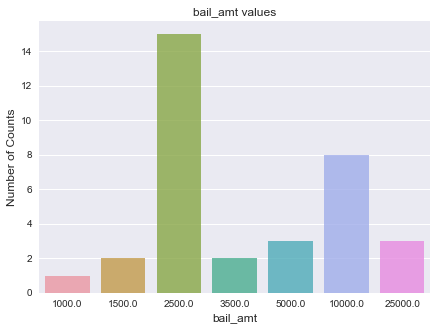

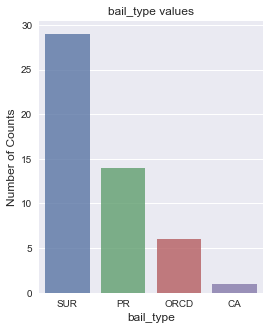

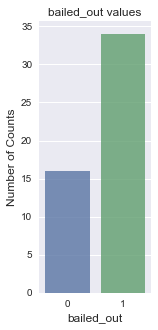

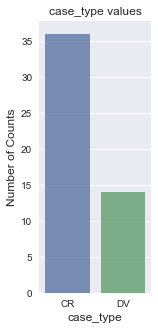

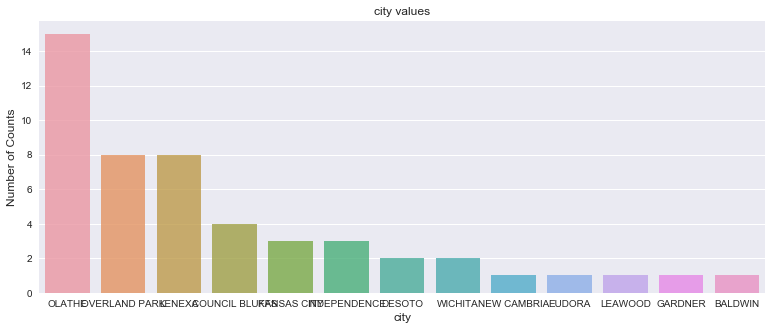

...

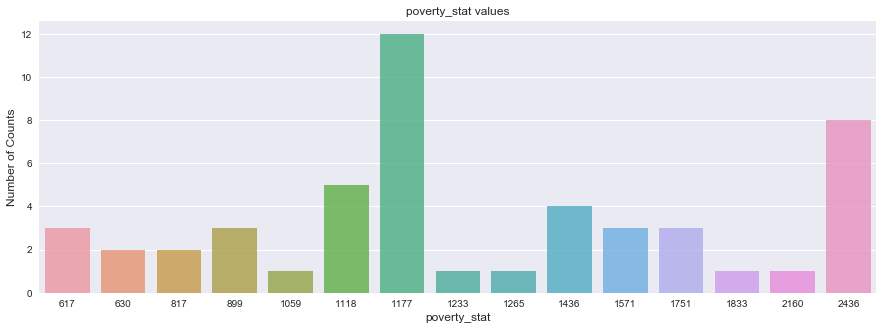

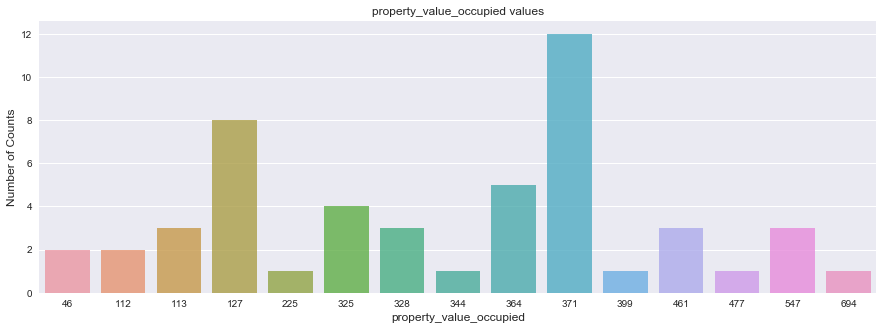

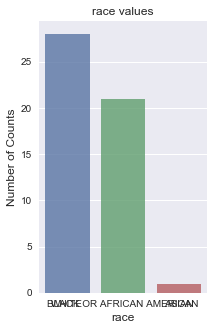

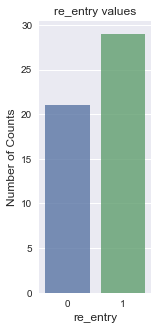

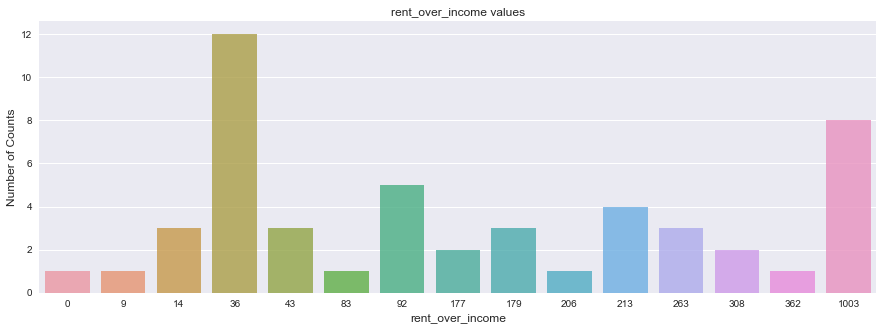

In [20]:
final_plot.plot_df(RF_df[:50], features_to_see, save=False)

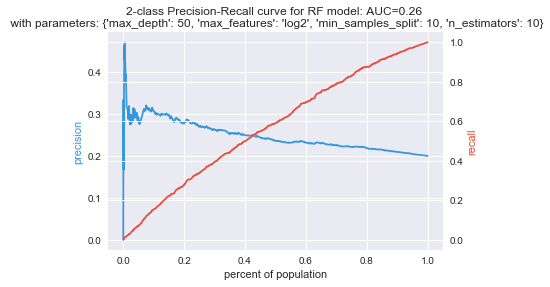

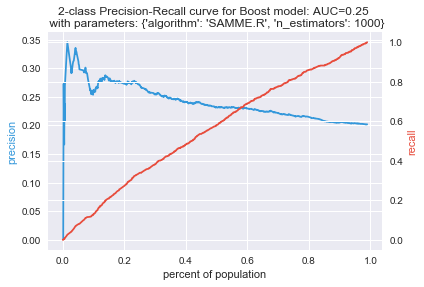

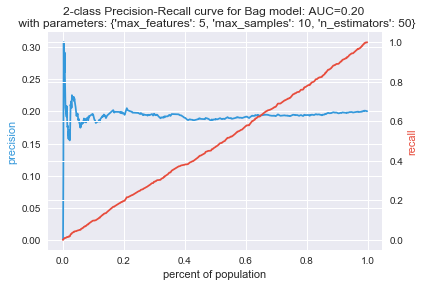

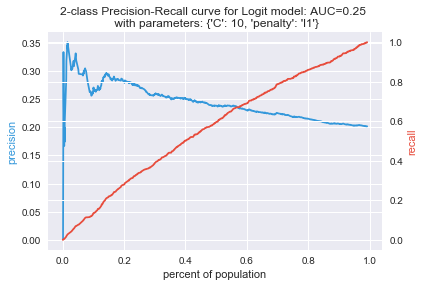

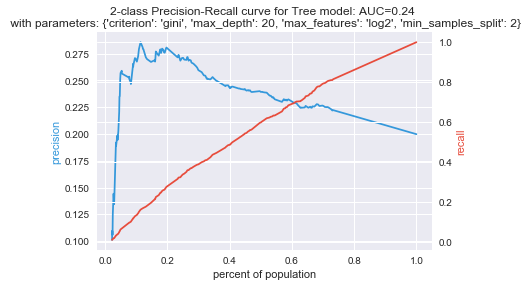

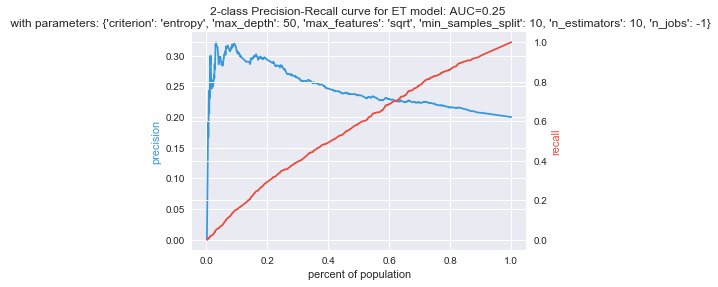

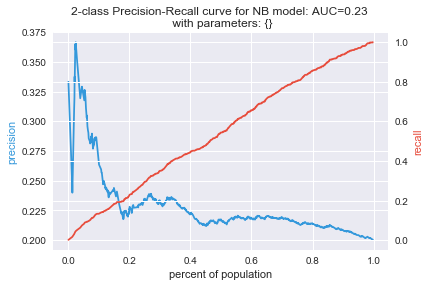

In [21]:
final_plot.plot_best(["RF", "Boost", "Bag", "Logit", "Tree",  "ET", "NB"],  x_train, x_test, y_train['within_one'], y_test['within_one'], best)

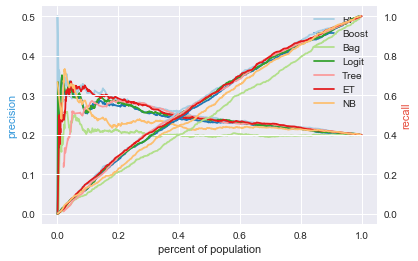

In [22]:
final_plot.plot_mult(['RF', 'Boost', 'Bag', 'Logit', 'Tree', 'ET', 'NB'], x_train, x_test, y_train['within_one'], y_test['within_one'], best)

Feature ranking for within_one
1. age_bin1 (0.055638)
2. sexFEMALE (0.054826)
3. mar_statS (0.048235)
4. sexMALE (0.046597)
5. raceWHITE (0.045844)
6. age_bin3 (0.044069)
7. age_bin2 (0.043994)
8. age_bin4 (0.042811)
9. mar_statM (0.041562)
10. raceBLACK OR AFRICAN AMERICAN (0.040080)
11. mar_statmissing (0.031836)
12. mar_statD (0.029817)
13. rent_over_income_bin2 (0.020026)
14. per_capita_income_bin1 (0.018412)
15. rent_over_income_bin3 (0.017504)
16. per_capita_income_bin3 (0.016866)
17. school_enrollment_16-19_bin4 (0.016794)
18. military_service_bin3 (0.016725)
19. school_enrollment_16-19_bin3 (0.016681)
20. school_enrollment_16-19_bin1 (0.015315)


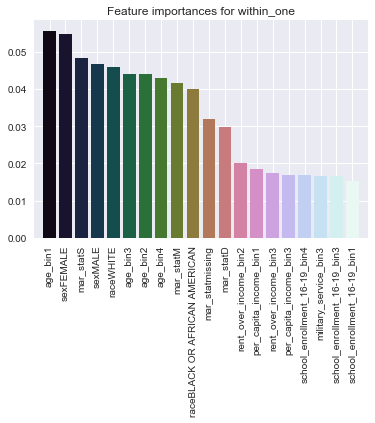

In [23]:
final_plot.feature_importance(x_train, y_train['within_one'], best, "ET",20)

In [25]:
########Running everything on second y within two year of re-entry

In [24]:
results2 = final_classifier_final.clf_loop(["RF", 'Boost', 'Bag', 'Logit', 'Tree', 'ET', 'NB'], x_train, x_test, y_train['within_two'], y_test['within_two'])

In [25]:
best2 = final_classifier_final.best_grid(results2)

,model_type,parameters,auc-roc,precision,time,"precision,recall,f1 at_5","precision,recall,f1 at_10","precision,recall,f1 at_20"
39,Bag,"{'max_features': 10, 'max_samples': 10, 'n_est...",0.5560,0.2910,0.1125,"(0.4121, 0.0799, 0.1338)","(0.3214, 0.1246, 0.1796)","(0.3146, 0.2439, 0.2747)"
23,Boost,"{'algorithm': 'SAMME.R', 'n_estimators': 1000}",0.5768,0.3137,14.8054,"(0.3846, 0.0745, 0.1249)","(0.3681, 0.1427, 0.2057)","(0.3448, 0.2673, 0.3011)"
109,ET,"{'criterion': 'entropy', 'max_depth': 50, 'max...",0.6014,0.3287,1.2996,"(0.3846, 0.0745, 0.1249)","(0.3791, 0.147, 0.2118)","(0.3599, 0.279, 0.3143)"
49,Logit,"{'C': 10, 'penalty': 'l2'}",0.5831,0.3190,0.2689,"(0.4066, 0.0788, 0.132)","(0.3681, 0.1427, 0.2057)","(0.3558, 0.2758, 0.3107)"
114,NB,{},0.5509,0.2986,0.0293,"(0.4121, 0.0799, 0.1338)","(0.3407, 0.1321, 0.1903)","(0.3063, 0.2375, 0.2675)"
15,RF,"{'max_depth': 50, 'max_features': 'log2', 'min...",0.6018,0.3331,1.3637,"(0.4176, 0.0809, 0.1356)","(0.4011, 0.1555, 0.2241)","(0.3626, 0.2812, 0.3167)"
61,Tree,"{'criterion': 'gini', 'max_depth': 20, 'max_fe...",0.6041,0.3198,0.0211,"(0.3736, 0.0724, 0.1213)","(0.4203, 0.1629, 0.2348)","(0.364, 0.2822, 0.3179)"


In [26]:
best2

{'Bag': {'max_features': [10], 'max_samples': [10], 'n_estimators': [50]},
 'Boost': {'algorithm': ['SAMME.R'], 'n_estimators': [1000]},
 'ET': {'criterion': ['entropy'],
  'max_depth': [50],
  'max_features': ['sqrt'],
  'min_samples_split': [10],
  'n_estimators': [100],
  'n_jobs': [-1]},
 'Logit': {'C': [10], 'penalty': ['l2']},
 'NB': {},
 'RF': {'max_depth': [50],
  'max_features': ['log2'],
  'min_samples_split': [10],
  'n_estimators': [100]},
 'Tree': {'criterion': ['gini'],
  'max_depth': [20],
  'max_features': ['log2'],
  'min_samples_split': [5]}}

In [28]:
df_sorting2 = final_classifier_final.finding_risk_scores(x_train, x_test, y_train['within_two'], y_test['within_two'], best2, viz_x)

Bag
Boost
ET
Logit
NB
RF
Tree


In [29]:
RF_df2 = df_sorting2.sort_values(by=['RF'], ascending=False)

In [30]:
RF_df2[:200]

,SSI_income,after_released,age,arresting_agency,arresting_agency_type,bail_amt,bail_type,bailed_out,booking_no,case_no,...,sex,state,zip,Bag,Boost,ET,Logit,NB,RF,Tree
22488,354,488.0,19.0,OLATHE P.D.,CITY,2500.0,PR,1,15010014,15CR02059,...,MALE,KS,67201,0.240000,0.499664,1.000000,0.200559,1.0,0.944618,1.000000
22489,354,-38.0,19.0,OLATHE P.D.,CITY,2500.0,PR,1,15010014,15CR02059,...,MALE,KS,67201,0.240000,0.499664,1.000000,0.200559,1.0,0.944618,1.000000
948,407,0.0,22.0,OVERLAND PARK P.D.,CITY,2500.0,ORCD,1,15011815,15CR02484,...,missing,KS,66062,0.400000,0.500338,0.960167,0.795226,1.0,0.941529,1.000000
8468,591,-127.0,40.0,OVERLAND PARK P.D.,CITY,NaN,SUR,0,15007735,15CR01572,...,FEMALE,KS,66204,0.273333,0.499873,0.846154,0.374032,1.0,0.830773,0.846154
8912,591,0.0,34.0,JOHNSON COUNTY SHERIFF'S DEPARTMENT,COUNTY SHERIFF,10000.0,SUR,1,15009332,15CR01845,...,FEMALE,KS,66204,0.273333,0.499873,0.846154,0.374032,1.0,0.830773,0.846154
8467,591,63.0,40.0,OVERLAND PARK P.D.,CITY,NaN,SUR,0,15007735,15CR01572,...,FEMALE,KS,66204,0.273333,0.499873,0.846154,0.374032,1.0,0.830773,0.846154
2595,475,1282.0,NaN,JOHNSON COUNTY SHERIFF'S DEPARTMENT,COUNTY SHERIFF,NaN,SUR,0,16000811,14CR02514,...,MALE,KS,66061,0.336667,0.499877,0.994167,0.407728,1.0,0.808957,1.000000
3837,475,0.0,NaN,JOHNSON COUNTY SHERIFF'S DEPARTMENT,COUNTY SHERIFF,NaN,SUR,0,16000762,16CR00054,...,MALE,KS,66061,0.336667,0.499877,0.994167,0.407728,1.0,0.808957,1.000000
3308,475,31.0,NaN,JOHNSON COUNTY SHERIFF'S DEPARTMENT,COUNTY SHERIFF,NaN,SUR,0,15011946,16CR00175,...,MALE,KS,66061,0.346667,0.499894,0.984167,0.422943,1.0,0.805964,1.000000
3156,475,970.0,NaN,OLATHE P.D.,CITY,NaN,SUR,0,16003462,16CR00346,...,MALE,KS,66061,0.346667,0.499894,0.984167,0.422943,1.0,0.805964,1.000000


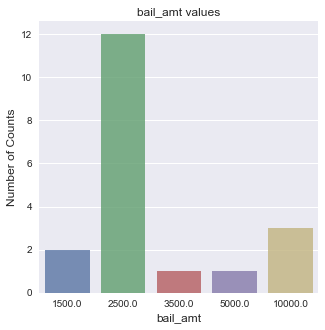

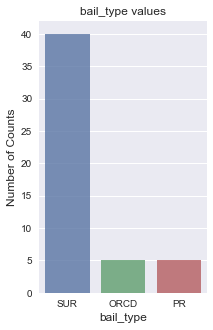

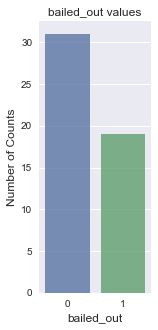

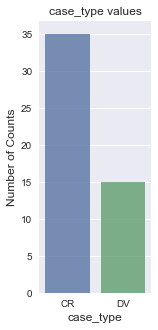

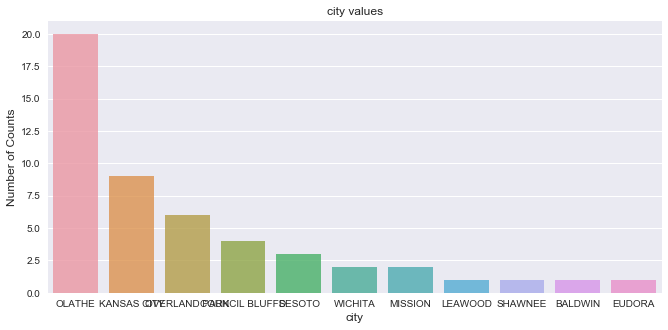

...

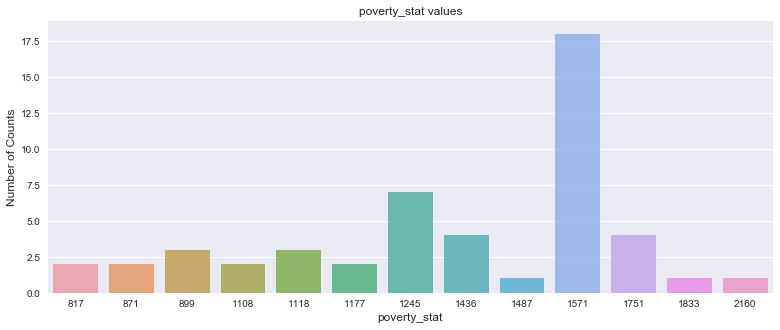

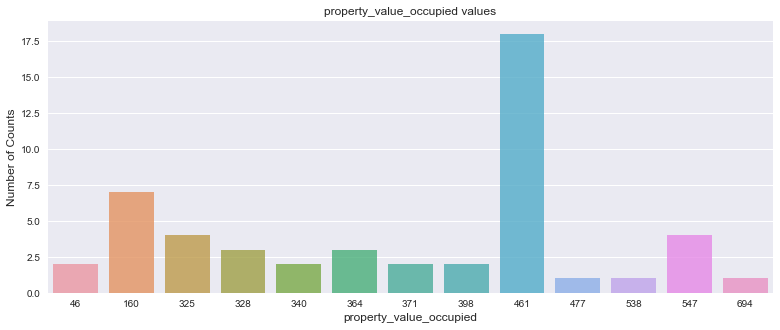

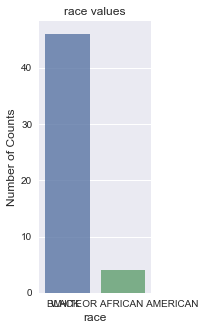

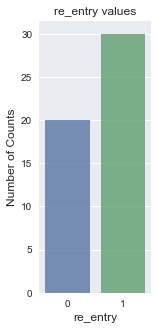

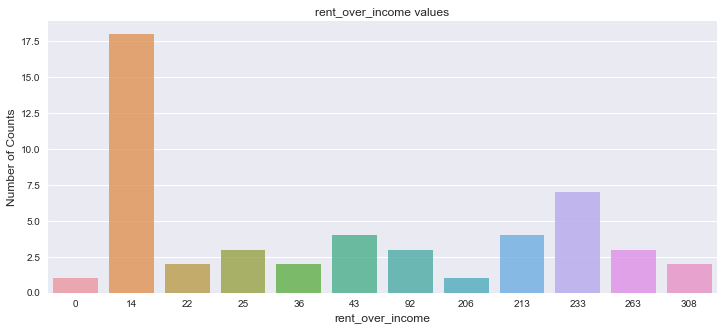

In [31]:
final_plot.plot_df(RF_df2[:50], features_to_see, save=False)

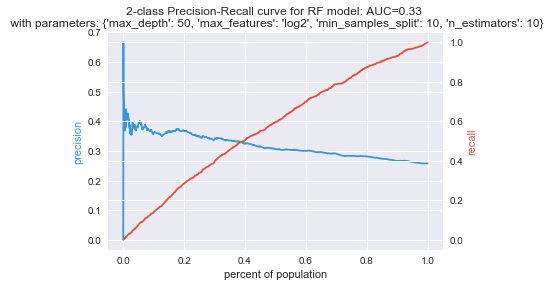

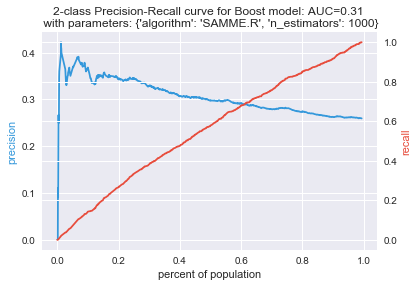

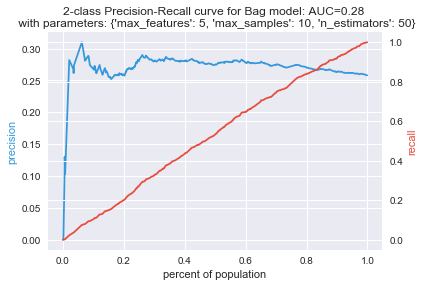

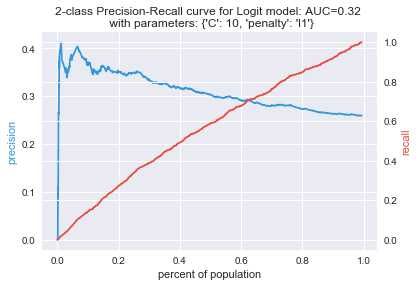

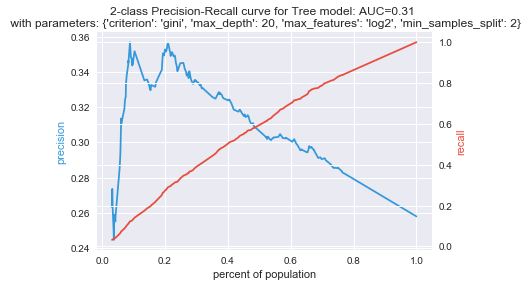

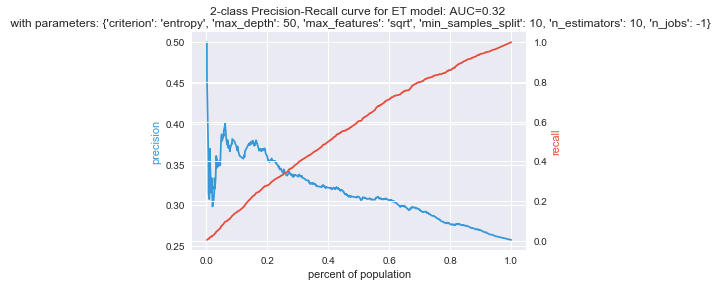

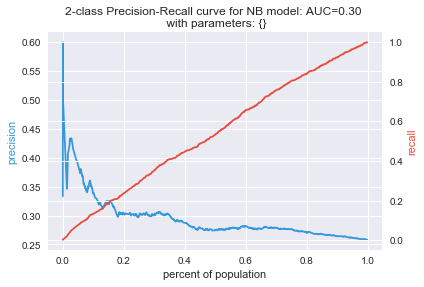

In [32]:
final_plot.plot_best(["RF", "Boost", "Bag", "Logit", "Tree",  "ET", "NB"],  x_train, x_test, y_train['within_two'], y_test['within_two'], best)

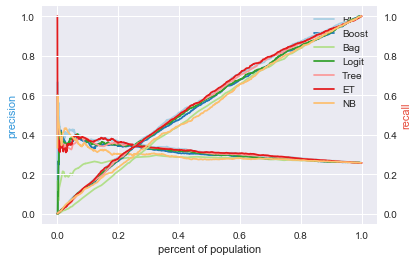

In [33]:
final_plot.plot_mult(['RF', 'Boost', 'Bag', 'Logit', 'Tree', 'ET', 'NB'], x_train, x_test, y_train['within_two'], y_test['within_two'], best2)

Feature ranking for within_two
1. age_bin1 (0.055539)
2. sexFEMALE (0.051180)
3. sexMALE (0.049588)
4. mar_statS (0.047264)
5. age_bin4 (0.045317)
6. age_bin2 (0.043908)
7. age_bin3 (0.042795)
8. mar_statM (0.041962)
9. raceWHITE (0.041069)
10. raceBLACK OR AFRICAN AMERICAN (0.038994)
11. mar_statmissing (0.033591)
12. mar_statD (0.029808)
13. per_capita_income_bin1 (0.021166)
14. school_enrollment_16-19_bin3 (0.018084)
15. rent_over_income_bin2 (0.017593)
16. rent_over_income_bin3 (0.017146)
17. school_enrollment_16-19_bin4 (0.016538)
18. per_capita_income_bin3 (0.016012)
19. school_enrollment_16-19_bin2 (0.015673)
20. military_service_bin3 (0.015611)


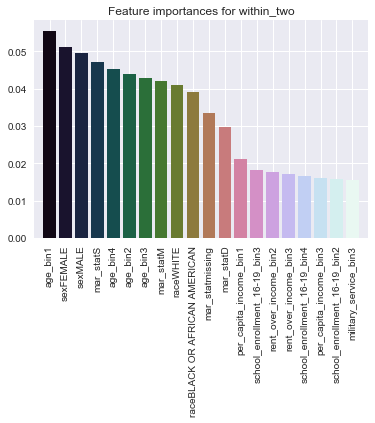

In [34]:
final_plot.feature_importance(x_train, y_train['within_two'], best2, "ET", 20)

In [37]:
################Print out the Decision Tree####################

In [35]:
final_plot.print_tree(x_train, y_train["within_one"], best)

In [36]:
final_plot.print_tree(x_train, y_train["within_two"], best2)